In [261]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Polygon

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)
plt.rcParams["figure.dpi"] = 100

### Get locations of solar arrays according to [Bradbury et al](https://www.nature.com/articles/sdata2016106#data-records)

Read data from malformed geojson

In [2]:
def read_geojson(geojson_file):
    import fiona
    from shapely.geometry import shape

    """When supplied with a malformed geojson, this function tries to return a geodataframe"""
    collection = list(fiona.open(geojson_file,'r'))
    
    df1 = pd.DataFrame(collection)

    #Check Geometry
    def isvalid(geom):
        try:
            shape(geom)
            return 1
        except:
            return 0
    df1['isvalid'] = df1['geometry'].apply(lambda x: isvalid(x))
    df1 = df1[df1['isvalid'] == 1]
    collection = json.loads(df1.to_json(orient='records'))

    #Convert to geodataframe
    return gpd.GeoDataFrame.from_features(collection)

In [3]:
PV_locations = read_geojson("./Data/SolarArrayPolygons.geojson")

In [4]:
PV_locations.head()

,area_meters,area_pixels,centroid_latitude,centroid_latitude_pixels,centroid_longitude,centroid_longitude_pixels,city,datum,geometry,image_name,jaccard_index,nw_corner_of_image_latitude,nw_corner_of_image_longitude,polygon_id,polygon_vertices_pixels,projection_zone,resolution,se_corner_of_image_latitude,se_corner_of_image_longitude
0,1513.254134,136.192872,36.92605521,107.6184581,-119.8402407,3286.151487,Fresno,NAD83,"POLYGON ((-119.83998 36.92599116, -119.8403656...",11ska460890,0.914020,36.926336,-119.851622,1,"[ [ 3360.495069, 131.6311637 ], [ 3249.19771, ...",11,0.3,36.913233,-119.8343
1,1727.907934,155.511714,36.92621668,45.977659,-119.8402414,3286.352946,Fresno,NAD83,"POLYGON ((-119.8399777 36.92615368, -119.84047...",11ska460890,0.829071,36.926336,-119.851622,2,"[ [ 3361.153846, 69.61538462 ], [ 3217.615385,...",11,0.3,36.913233,-119.8343
2,1242.184349,111.796591,36.92627713,22.28085129,-119.8401735,3303.465657,Fresno,NAD83,"POLYGON ((-119.8399886 36.92620997, -119.83998...",11ska460890,0.937961,36.926336,-119.851622,3,"[ [ 3358.015726, 48.13686322 ], [ 3358.05, 48....",11,0.3,36.913233,-119.8343
3,688.933420,62.004008,36.92096936,2048.362567,-119.8427983,2547.366116,Fresno,NAD83,"POLYGON ((-119.8427131 36.92091667, -119.84271...",11ska460890,0.842634,36.926336,-119.851622,4,"[ [ 2571.591716, 2068.04931 ], [ 2571.021266, ...",11,0.3,36.913233,-119.8343
4,1060.890554,95.480150,36.92093761,2060.01489,-119.8428595,2529.504997,Fresno,NAD83,"POLYGON ((-119.8427401 36.92085549, -119.84294...",11ska460890,0.890998,36.926336,-119.851622,5,"[ [ 2563.781065, 2091.398422 ], [ 2504.416174,...",11,0.3,36.913233,-119.8343


### Load GeoTiff and plot it

In [70]:
def plot_geotiff(image_id):
    "Return a matplotlib plot with PVs overlayed"

    from matplotlib.patches import Polygon
    from matplotlib.collections import PatchCollection
    import matplotlib
    import matplotlib.pyplot as plt


    city = PV_locations[(PV_locations.image_name == image_id)].iloc[0].city
    pv_arrays_in_image = PV_locations[(PV_locations.image_name == image_id)].sort_values("area_meters", ascending=False)

    fname = './Data/{0}/{1}.tif'.format(city, image_id)

    img = matplotlib.image.imread(fname)

    aspect_ratio= img.shape[0]/img.shape[1]
    
    fig, ax = plt.subplots(figsize=(10, 10*aspect_ratio), dpi=100)
    
    ax.imshow(img, origin='upper')
    plt.axis('scaled')
    
    patches = []

    for i, row in pv_arrays_in_image.iterrows():
        # convert array in string to list of lists
        polygon = Polygon(json.loads(row["polygon_vertices_pixels"]), True)
        patches.append(polygon)

    p = PatchCollection(patches, color="yellow", linewidth=4, alpha=0.8)

    ax.add_collection(p)

    return plt

In [50]:
def get_image(image_id, filetype="jpg"):
    from PIL import Image
    # First get which city the image belongs to
    city = PV_locations[(PV_locations.image_name == image_id)].iloc[0].city
    pv_arrays_in_image = PV_locations[(PV_locations.image_name == image_id)].sort_values("area_meters", ascending=False)

    return np.array(Image.open("Data/{0}/{1}.{2}".format(city, image_id, filetype)))

In [123]:
def mser(cv_image):
    import cv2

    vis = cv_image.copy()
    mser = cv2.MSER_create()
    regions, bboxes = mser.detectRegions(cv_image)
    for p in regions:
        xmax, ymax = np.amax(p, axis=0)
        xmin, ymin = np.amin(p, axis=0)
        cv2.rectangle(vis, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
    return vis, bboxes

<module 'matplotlib.pyplot' from '/home/durand/Stuff/Sources/anaconda3/envs/PV_detection/lib/python3.6/site-packages/matplotlib/pyplot.py'>

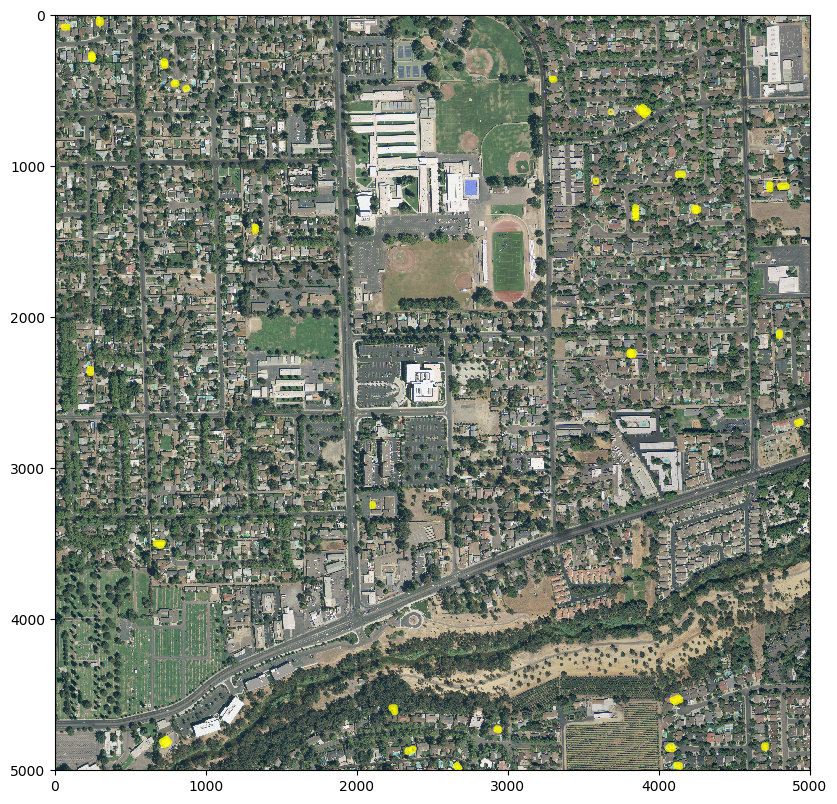

In [111]:
random_image = PV_locations[PV_locations.city.isin(["Modesto", "Oxnard"])].sample(n=1).iloc[0]["image_name"]

plot_geotiff(random_image)

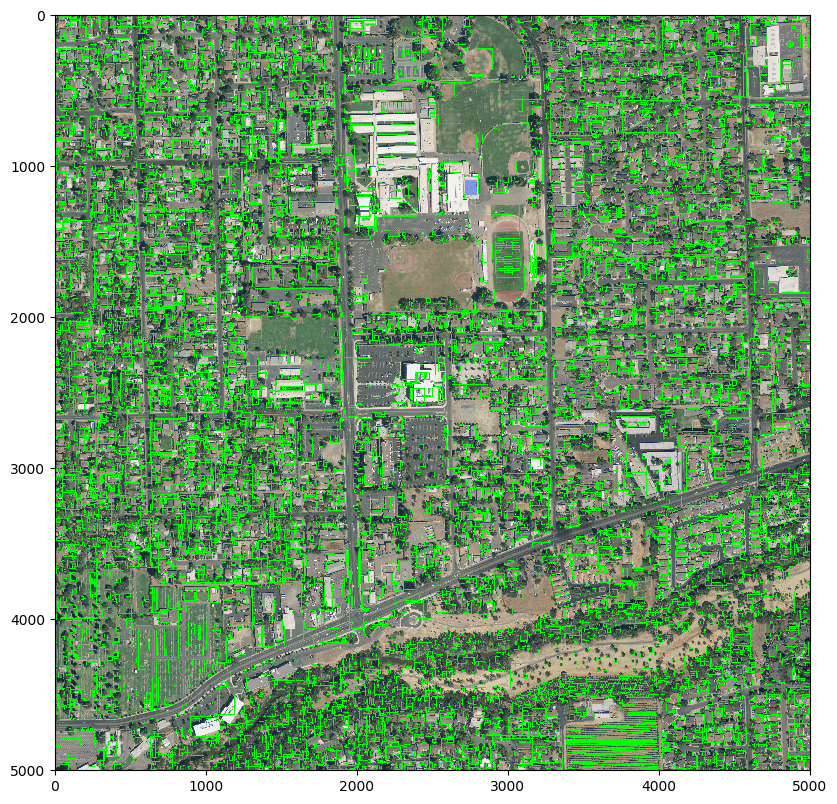

In [379]:
pic = get_image(random_image, "tif")
tile = pic#[0:100, 0:100]
regions, bboxes = mser(tile)

plt.imshow(regions)

In [385]:
x, y, width, height = bboxes[1]
region = tile[y:y+height, x:x+width]

In [197]:
# Calculate mean colour for each detected MSER region
mean_rgb = np.apply_over_axes(np.mean, region, (0,1))

In [383]:
# Get polygons for PVs in training data
polygon = np.array(json.loads(PV_locations.iloc[15260]["polygon_vertices_pixels"])).astype(np.int32)

# turn them into a boolean mask
mask = np.zeros(pic.shape[:2]).astype(np.int32)
cv2.fillConvexPoly(mask, polygon, 1)
mask = mask.astype(bool)

# Calculate the mean colour for a single PV
np.apply_over_axes(np.mean, pic[mask], (0))

In [345]:
def plotly_geotiff(image_id, plot_width=800, plot_height=800):
    """When given an image id, show the image along with an overlay containing all visible PVs using plotly"""
    # First get which city the image belongs to
    city = PV_locations[(PV_locations.image_name == image_id)].iloc[0].city
    pv_arrays_in_image = PV_locations[(PV_locations.image_name == image_id)].sort_values("area_meters", ascending=False)

    import plotly.offline as py
    import plotly.graph_objs as go
    from PIL import Image
    
    original_img_width, original_img_height = Image.open("Data/{0}/{1}.tif".format(city, image_id)).size

    py.init_notebook_mode()

    # Original size of image
    img_width, img_height = Image.open("Data/{0}/{1}.jpg".format(city, image_id)).size
    scale_factor = 1

    layout= go.Layout(
                    title="{0} - {1}.tif".format(city, image_id),
                    xaxis = go.layout.XAxis(showticklabels = False,
                                            showgrid=False,
                                            zeroline=False,
                                            range = [0,img_width*scale_factor],
                                           ),
                    yaxis = go.layout.YAxis(showticklabels = False,
                                            showgrid=False,
                                            zeroline=False,
                                            scaleanchor = 'x',
                                            autorange='reversed',
                                            range = [0,img_height*scale_factor]
                                           ),
                    autosize=True,
                    # Size of plotly graph
                    height=plot_height,
                    #width=plot_width,
        margin = {'l': 0, 'r': 0, 't': 30, 'b': 0},
                    images= [dict(
                        source="Data/{0}/{1}.jpg".format(city, image_id),
                        x= 0,
                        sizex=img_width*scale_factor,
                        y=0,#img_height*scale_factor,
                        sizey=img_height*scale_factor,
                        xref="x", yref="y",
                        sizing= "stretch",
                        opacity= 1,
                        layer= "below")]
                     )

    PVs = []
    
    for i, row in pv_arrays_in_image.iterrows():
        polygon_pixels = np.array(json.loads(row["polygon_vertices_pixels"]))
        
        PVs.append(go.Scattergl(
        x=polygon_pixels[:,0] * img_width/original_img_width,
            y=polygon_pixels[:,1] * img_height/original_img_height,
        #y=(original_img_height-polygon_pixels[:,1])*img_height/original_img_height,
            name = "ID: {0} Area: {1:.0f}".format(i, row["area_meters"]),
            text = "Lat: {lat:.3f}° Long: {long:.3f}° Area: {area:.0f}m²".format(lat=float(row["centroid_latitude"]),
                                                                                 long=float(row["centroid_longitude"]),
                                                                                 area=row["area_meters"]),
            mode='lines',
            showlegend = True,
            hoveron = 'fills',
            fill='toself',
            line = dict(width=4, color='blue')))

    py.iplot(dict(data=PVs,layout=layout))

In [346]:
plotly_geotiff(random_image, plot_height=800)